# <center style='color:darkkhaki'> Create patches from a big image both `sequentially` and `randomly` </center>

## 1. Import required libraries

In [1]:
import patchify
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

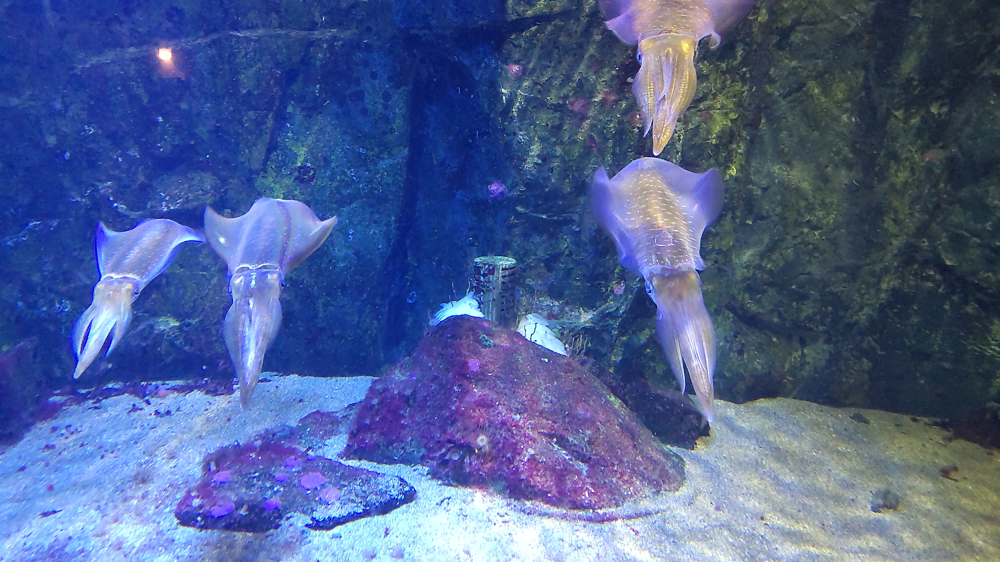

In [2]:
IMG = Image.open('SQUID.JPG')
IMG

## 2. Check image size

In [3]:
IMG.size # (width, height)

(4000, 2250)

In [4]:
IMG.width

4000

In [5]:
IMG.height

2250

## 3. Check file format

In [6]:
IMG.mode

'RGB'

## 4. Resize the image

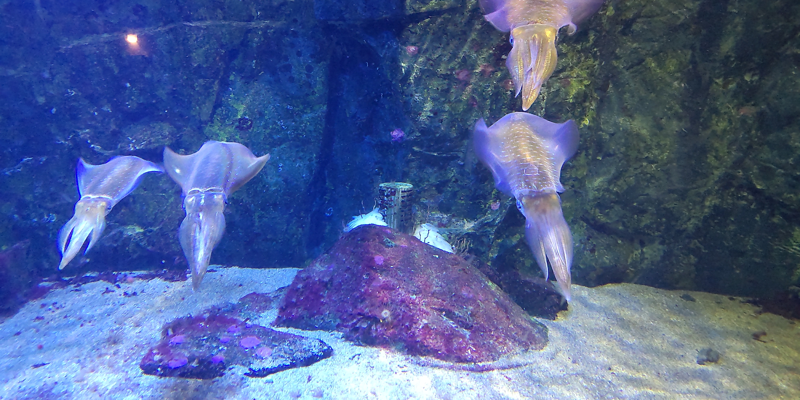

In [7]:
resized = IMG.resize((800, 400))
resized

In [8]:
resized.size

(800, 400)

In [9]:
type(resized)

PIL.Image.Image

## 5. Create patches `sequentially`

In [10]:
gather = []

patches = patchify.patchify(np.asarray(resized), patch_size=(100, 100, 3), step=100)

In [11]:
patches.shape

(4, 8, 1, 100, 100, 3)

In [12]:
for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        get_patches = patches[i, j, 0, :, :, :]
        gather.append(get_patches)

In [13]:
len(gather)

32

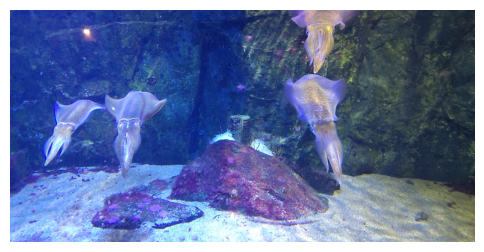

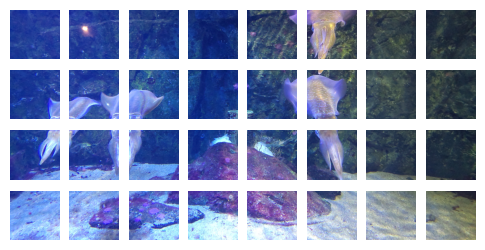

In [14]:
plt.figure(figsize=(6, 4))
plt.imshow(resized)
plt.axis('off')

fig1, ax1 = plt.subplots(nrows=4, ncols=8, figsize=(6, 3))

a = 0
for R1 in range(4):
    for C1 in range(8):
        ax1[R1, C1].imshow(gather[a])
        ax1[R1, C1].axis('off')
        a += 1

## 6. Create patches `randomly`

In [15]:
collect = []

IMG_to_ARR = np.asarray(resized)

In [16]:
IMG_to_ARR.shape

(400, 800, 3)

In [17]:
for k in range(32):
    x = np.random.randint(IMG_to_ARR.shape[0] - 100)
    y = np.random.randint(IMG_to_ARR.shape[1] - 100)
    random_patches = IMG_to_ARR[x:x+100, y:y+100]
    collect.append(random_patches)

In [18]:
len(collect)

32

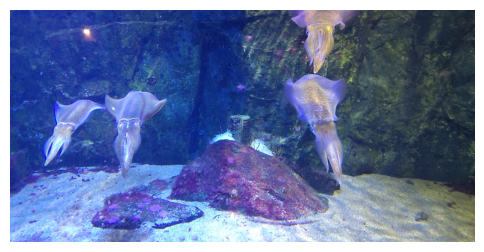

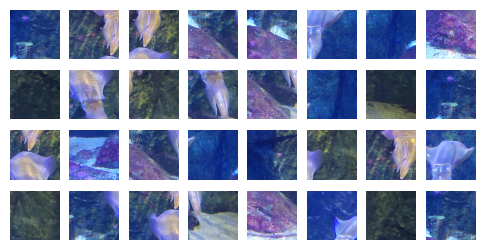

In [19]:
plt.figure(figsize=(6, 4))
plt.imshow(resized)
plt.axis(False)

fig2, ax2 = plt.subplots(nrows=4, ncols=8, figsize=(6, 3))

b = 0
for R2 in range(4):
    for C2 in range(8):
        ax2[R2, C2].imshow(collect[b])
        ax2[R2, C2].axis(False)
        b += 1